**CS795/895 Computational Imaging Coding**

**Noisy Image Generation (Poisson + Gaussian):**
This script processes clean microscopy .tif images by adding realistic noise based on a combination of Poisson (shot) noise and Gaussian (readout) noise.
Poisson noise simulates photon arrival randomness, while Gaussian noise accounts for sensor imperfections.
The noisy images are saved in 16-bit TIFF format to maintain high fidelity.
Additionally, a visualization function randomly displays pairs of clean and noisy images for qualitative inspection.
The operations are optimized to run on GPU if available.

In [4]:
pip install nbformat


Using device: cuda
Loaded 437 clean images and saved noisy images to '/content/noisy_images/'.


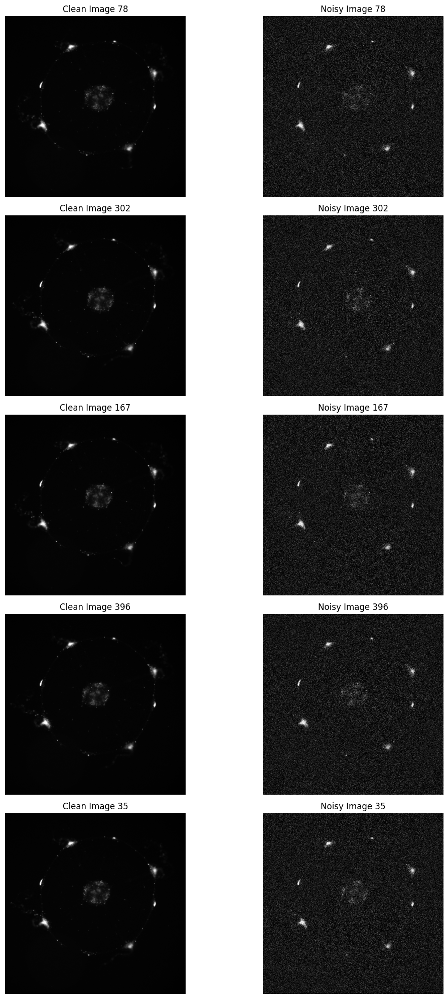

In [ ]:
import os
import torch
import tifffile
import matplotlib.pyplot as plt

# === Paths ===
clean_folder = '/content/clean_images/'    # Folder where clean .tif images are stored
noisy_folder = '/content/noisy_images/'     # Folder where noisy images will be saved

# Create the noisy folder if it doesn't exist
os.makedirs(noisy_folder, exist_ok=True)

# === Device Setup ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# === Noise Function (STRONG, visible) ===
def add_strong_shot_read_noise(image, peak=1000, read_noise_std=5):
    """
    Adds visibly strong shot (Poisson) and read (Gaussian) noise to an input image.
    Args:
        image: Input image normalized to [0,1], torch tensor on device.
        peak: Photon peak level for Poisson noise (lower peak = more visible noise).
        read_noise_std: Read noise standard deviation (higher = more noise).
    Returns:
        noisy_image: Noisy image clipped to [0,1].
    """
    # Scale to photon counts
    scaled_image = image * peak

    # Apply Poisson noise (CPU side because torch.poisson() not available)
    scaled_image_cpu = scaled_image.cpu()
    shot_noisy = torch.poisson(scaled_image_cpu).to(device)

    # Scale back to [0,1]
    shot_noisy = shot_noisy / peak

    # Apply Gaussian read noise (on GPU)
    gaussian_noise = torch.randn_like(image) * (read_noise_std / peak)
    noisy_image = shot_noisy + gaussian_noise

    # Clip to [0,1]
    noisy_image = torch.clamp(noisy_image, 0, 1)

    return noisy_image

# === Load Clean Images and Generate Noisy Images ===
clean_files = sorted([f for f in os.listdir(clean_folder) if f.endswith('.tif')])

clean_images = []
noisy_images = []

for fname in clean_files:
    # Load clean image
    img_path = os.path.join(clean_folder, fname)
    img = tifffile.imread(img_path).astype('float32')
    img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1]

    img_tensor = torch.from_numpy(img).to(device)

    clean_images.append(img_tensor)

    # Generate noisy image
    noisy_img = add_strong_shot_read_noise(img_tensor, peak=100, read_noise_std=20)
    noisy_images.append(noisy_img)

    # Save noisy image (move to CPU for saving)
    noisy_img_cpu = (noisy_img.clamp(0,1) * 65535).to(torch.uint16).cpu().numpy()
    noisy_fname = f"noisy_{fname}"  # e.g., 'noisy_jellyfish0000.tif'
    noisy_path = os.path.join(noisy_folder, noisy_fname)
    tifffile.imwrite(noisy_path, noisy_img_cpu)

print(f"Loaded {len(clean_images)} clean images and saved noisy images to '{noisy_folder}'.")

# === Visualization: Show Clean vs Noisy ===
def visualize_clean_noisy(clean_imgs, noisy_imgs, num_samples=5):
    plt.figure(figsize=(12, 4 * num_samples))

    for i in range(num_samples):
        idx = torch.randint(0, len(clean_imgs), (1,)).item()

        # Clean Image
        plt.subplot(num_samples, 2, 2*i + 1)
        plt.imshow(clean_imgs[idx].cpu().numpy(), cmap='gray')
        plt.title(f"Clean Image {idx}")
        plt.axis('off')

        # Noisy Image
        plt.subplot(num_samples, 2, 2*i + 2)
        plt.imshow(noisy_imgs[idx].cpu().numpy(), cmap='gray')
        plt.title(f"Noisy Image {idx}")
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# === Usage ===
visualize_clean_noisy(clean_images, noisy_images, num_samples=5)


**Dataset Preparation (Training and Validation Split):**
After generating noisy images, this script loads both clean and noisy images, normalizes them to a standard [0,1] intensity range, and structures them into PyTorch tensors.
The datasets are stacked and then split into an 80% training set and a 20% validation set using a reproducible random seed.
This prepares the data for supervised learning while ensuring that performance can be evaluated separately on unseen validation data during training.



In [ ]:
import os
import torch
import tifffile
from sklearn.model_selection import train_test_split

# === Set Folders ===
clean_folder = '/content/clean_images/'
noisy_folder = '/content/noisy_images/'

# === Device Setup ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# === List and Sort Files ===
clean_files = sorted([f for f in os.listdir(clean_folder) if f.endswith('.tif')])
noisy_files = sorted([f for f in os.listdir(noisy_folder) if f.endswith('.tif')])

# === Load Images ===
clean_images = []
noisy_images = []

for clean_fname, noisy_fname in zip(clean_files, noisy_files):
    # Load clean image
    clean_path = os.path.join(clean_folder, clean_fname)
    clean_img = tifffile.imread(clean_path).astype('float32')
    clean_img = (clean_img - clean_img.min()) / (clean_img.max() - clean_img.min())
    clean_img = torch.from_numpy(clean_img).unsqueeze(0)  # Add channel dimension (1, H, W)
    clean_images.append(clean_img)

    # Load noisy image
    noisy_path = os.path.join(noisy_folder, noisy_fname)
    noisy_img = tifffile.imread(noisy_path).astype('float32')
    noisy_img = (noisy_img - noisy_img.min()) / (noisy_img.max() - noisy_img.min())
    noisy_img = torch.from_numpy(noisy_img).unsqueeze(0)  # Add channel dimension (1, H, W)
    noisy_images.append(noisy_img)

print(f"Loaded {len(clean_images)} image pairs.")

# === Stack all images into one big tensor ===
clean_images = torch.stack(clean_images)  # (N, 1, H, W)
noisy_images = torch.stack(noisy_images)

# === 80-20 Split ===
train_noisy, val_noisy, train_clean, val_clean = train_test_split(
    noisy_images, clean_images, test_size=0.2, random_state=42)

# === Move to Device (GPU) ===
train_noisy = train_noisy.to(device)
train_clean = train_clean.to(device)
val_noisy = val_noisy.to(device)
val_clean = val_clean.to(device)

print(f"Training set: {len(train_noisy)} images")
print(f"Validation set: {len(val_noisy)} images")


Using device: cuda
Loaded 437 image pairs.
Training set: 349 images
Validation set: 88 images


**Supervised Training: Deep U-Net:**
A deeper U-Net architecture is defined, featuring multiple encoding and decoding layers with skip connections to preserve fine details during denoising.
The model is trained on the clean-noisy image pairs using an L1 reconstruction loss and an Adam optimizer with a learning rate of 1e-3.
Training and validation losses are recorded across epochs to monitor learning behavior.
After training, a visualization shows sample noisy inputs, denoised outputs, and corresponding clean ground truths side-by-side.
Finally, the trained model weights are saved for later deployment or evaluation.

Training on cuda
Epoch [1/20] ➔ Train Loss: 0.011725 | Val Loss: 0.008926
Epoch [2/20] ➔ Train Loss: 0.008633 | Val Loss: 0.006394
Epoch [3/20] ➔ Train Loss: 0.005566 | Val Loss: 0.005383
Epoch [4/20] ➔ Train Loss: 0.005121 | Val Loss: 0.004852
Epoch [5/20] ➔ Train Loss: 0.004765 | Val Loss: 0.004627
Epoch [6/20] ➔ Train Loss: 0.005071 | Val Loss: 0.005379
Epoch [7/20] ➔ Train Loss: 0.004753 | Val Loss: 0.004763
Epoch [8/20] ➔ Train Loss: 0.004542 | Val Loss: 0.004360
Epoch [9/20] ➔ Train Loss: 0.004195 | Val Loss: 0.004146
Epoch [10/20] ➔ Train Loss: 0.004127 | Val Loss: 0.003893
Epoch [11/20] ➔ Train Loss: 0.003819 | Val Loss: 0.003649
Epoch [12/20] ➔ Train Loss: 0.003639 | Val Loss: 0.003534
Epoch [13/20] ➔ Train Loss: 0.003530 | Val Loss: 0.003473
Epoch [14/20] ➔ Train Loss: 0.003524 | Val Loss: 0.003444
Epoch [15/20] ➔ Train Loss: 0.003397 | Val Loss: 0.003473
Epoch [16/20] ➔ Train Loss: 0.003373 | Val Loss: 0.003339
Epoch [17/20] ➔ Train Loss: 0.003242 | Val Loss: 0.003174
Epoch 

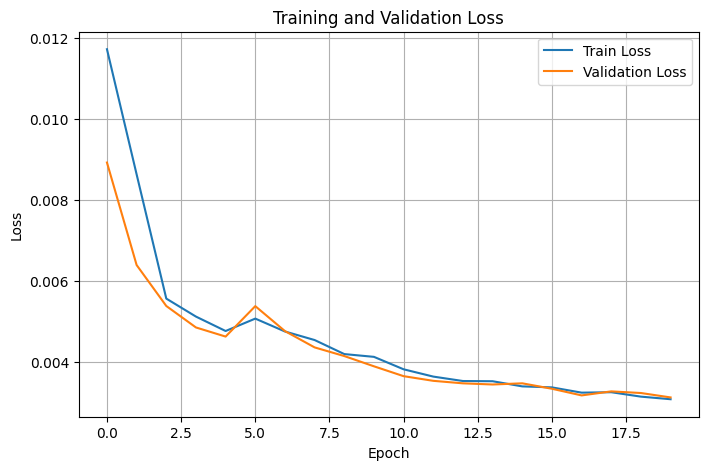

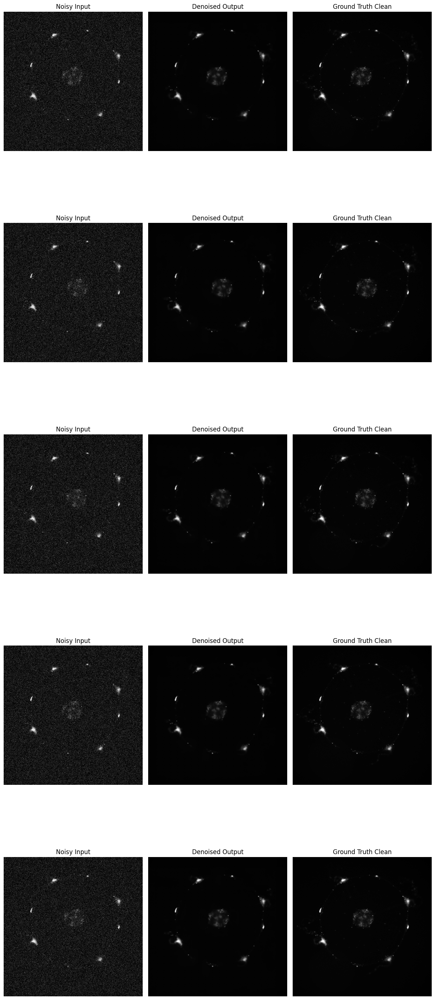

Model saved to /content/deep_unet_denoise.pth


In [ ]:
import os
import torch
import torch.nn as nn
import torch.optim as optim
from torch.utils.data import TensorDataset, DataLoader
import matplotlib.pyplot as plt

# === Device Setup ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Training on {device}")

# === Assume you already have loaded earlier ===
# - train_noisy, train_clean, val_noisy, val_clean

# === DataLoader Setup ===
batch_size = 8

train_dataset = TensorDataset(train_noisy, train_clean)
val_dataset = TensorDataset(val_noisy, val_clean)

train_loader = DataLoader(train_dataset, batch_size=batch_size, shuffle=True)
val_loader = DataLoader(val_dataset, batch_size=batch_size, shuffle=False)

# === Define Deeper U-Net ===
class DeepUNet(nn.Module):
    def __init__(self):
        super(DeepUNet, self).__init__()

        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )

        self.enc1 = conv_block(1, 32)
        self.pool1 = nn.MaxPool2d(2)

        self.enc2 = conv_block(32, 64)
        self.pool2 = nn.MaxPool2d(2)

        self.enc3 = conv_block(64, 128)
        self.pool3 = nn.MaxPool2d(2)

        self.bottleneck = conv_block(128, 256)

        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec3 = conv_block(256 + 128, 128)

        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec2 = conv_block(128 + 64, 64)

        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec1 = conv_block(64 + 32, 32)

        self.final = nn.Conv2d(32, 1, kernel_size=1)

    def forward(self, x):
        enc1 = self.enc1(x)  # (N,32,H,W)
        enc2 = self.enc2(self.pool1(enc1))  # (N,64,H/2,W/2)
        enc3 = self.enc3(self.pool2(enc2))  # (N,128,H/4,W/4)

        bottleneck = self.bottleneck(self.pool3(enc3))  # (N,256,H/8,W/8)

        dec3 = self.up3(bottleneck)  # (N,256,H/4,W/4)
        dec3 = torch.cat([dec3, enc3], dim=1)
        dec3 = self.dec3(dec3)  # (N,128,H/4,W/4)

        dec2 = self.up2(dec3)  # (N,128,H/2,W/2)
        dec2 = torch.cat([dec2, enc2], dim=1)
        dec2 = self.dec2(dec2)  # (N,64,H/2,W/2)

        dec1 = self.up1(dec2)  # (N,64,H,W)
        dec1 = torch.cat([dec1, enc1], dim=1)
        dec1 = self.dec1(dec1)  # (N,32,H,W)

        out = self.final(dec1)
        return out

# === Initialize Model, Loss, Optimizer ===
model = DeepUNet().to(device)
criterion = nn.L1Loss()
optimizer = optim.Adam(model.parameters(), lr=1e-3)

# === Training Loop ===
num_epochs = 20
train_losses = []
val_losses = []

for epoch in range(num_epochs):
    model.train()
    running_loss = 0.0
    for noisy_imgs, clean_imgs in train_loader:
        noisy_imgs = noisy_imgs.to(device)
        clean_imgs = clean_imgs.to(device)

        optimizer.zero_grad()
        outputs = model(noisy_imgs)
        loss = criterion(outputs, clean_imgs)
        loss.backward()
        optimizer.step()

        running_loss += loss.item() * noisy_imgs.size(0)

    epoch_loss = running_loss / len(train_loader.dataset)
    train_losses.append(epoch_loss)

    model.eval()
    val_running_loss = 0.0
    with torch.no_grad():
        for noisy_imgs, clean_imgs in val_loader:
            noisy_imgs = noisy_imgs.to(device)
            clean_imgs = clean_imgs.to(device)

            outputs = model(noisy_imgs)
            loss = criterion(outputs, clean_imgs)
            val_running_loss += loss.item() * noisy_imgs.size(0)

    val_epoch_loss = val_running_loss / len(val_loader.dataset)
    val_losses.append(val_epoch_loss)

    print(f"Epoch [{epoch+1}/{num_epochs}] ➔ Train Loss: {epoch_loss:.6f} | Val Loss: {val_epoch_loss:.6f}")

print("Training finished!")

# === 📊 Plot Training and Validation Loss ===
plt.figure(figsize=(8, 5))
plt.plot(train_losses, label='Train Loss')
plt.plot(val_losses, label='Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.title('Training and Validation Loss')
plt.legend()
plt.grid(True)
plt.show()

# === 🎨 Visualize Denoised Outputs ===
def visualize_denoising(model, noisy_imgs, clean_imgs, num_samples=5):
    model.eval()
    plt.figure(figsize=(12, 6 * num_samples))

    for i in range(num_samples):
        idx = torch.randint(0, len(noisy_imgs), (1,)).item()

        noisy_img = noisy_imgs[idx].unsqueeze(0).to(device)

        with torch.no_grad():
            denoised_img = model(noisy_img).squeeze().cpu().numpy()

        noisy_np = noisy_imgs[idx].squeeze().cpu().numpy()
        clean_np = clean_imgs[idx].squeeze().cpu().numpy()

        plt.subplot(num_samples, 3, i*3 + 1)
        plt.imshow(noisy_np, cmap='gray')
        plt.title('Noisy Input')
        plt.axis('off')

        plt.subplot(num_samples, 3, i*3 + 2)
        plt.imshow(denoised_img, cmap='gray')
        plt.title('Denoised Output')
        plt.axis('off')

        plt.subplot(num_samples, 3, i*3 + 3)
        plt.imshow(clean_np, cmap='gray')
        plt.title('Ground Truth Clean')
        plt.axis('off')

    plt.tight_layout()
    plt.show()

# === Usage ===
visualize_denoising(model, val_noisy.cpu(), val_clean.cpu(), num_samples=5)

# === 💾 Save the Model ===
save_path = '/content/deep_unet_denoise.pth'
torch.save(model.state_dict(), save_path)
print(f"Model saved to {save_path}")


**Interactive Denoising: Deep U-Net:**
An interactive system is created to allow users to manually upload a noisy .tif microscopy image.
The uploaded image is normalized, processed through the trained Deep U-Net model, and the denoised output is displayed immediately alongside the original noisy input.
This demo enables easy, real-time evaluation of the model's performance without requiring manual file path changes or re-running training scripts.
GPU acceleration is leveraged for rapid inference.

Using device: cuda
✅ Model loaded and ready.
📂 Please upload a noisy .tif image:


FileUpload(value={}, accept='.tif', description='Upload')

✅ Uploaded file: noisy_jellyfish0000.tif


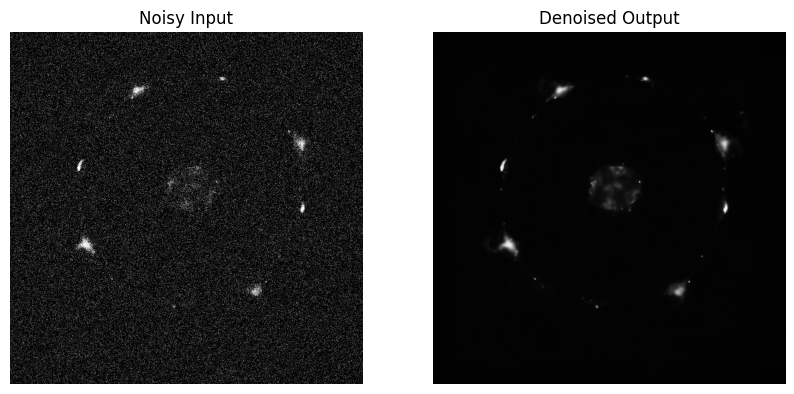

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import ipywidgets as widgets
from IPython.display import display
from io import BytesIO

# === Device Setup ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# === Define Deep U-Net ===
class DeepUNet(nn.Module):
    def __init__(self):
        super(DeepUNet, self).__init__()
        def conv_block(in_channels, out_channels):
            return nn.Sequential(
                nn.Conv2d(in_channels, out_channels, kernel_size=3, padding=1),
                nn.ReLU(inplace=True),
                nn.Conv2d(out_channels, out_channels, kernel_size=3, padding=1),
                nn.ReLU(inplace=True)
            )
        self.enc1 = conv_block(1, 32)
        self.pool1 = nn.MaxPool2d(2)
        self.enc2 = conv_block(32, 64)
        self.pool2 = nn.MaxPool2d(2)
        self.enc3 = conv_block(64, 128)
        self.pool3 = nn.MaxPool2d(2)
        self.bottleneck = conv_block(128, 256)
        self.up3 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec3 = conv_block(256 + 128, 128)
        self.up2 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec2 = conv_block(128 + 64, 64)
        self.up1 = nn.Upsample(scale_factor=2, mode='bilinear', align_corners=True)
        self.dec1 = conv_block(64 + 32, 32)
        self.final = nn.Conv2d(32, 1, kernel_size=1)

    def forward(self, x):
        enc1 = self.enc1(x)
        enc2 = self.enc2(self.pool1(enc1))
        enc3 = self.enc3(self.pool2(enc2))
        bottleneck = self.bottleneck(self.pool3(enc3))
        dec3 = self.up3(bottleneck)
        dec3 = self.dec3(torch.cat([dec3, enc3], dim=1))
        dec2 = self.up2(dec3)
        dec2 = self.dec2(torch.cat([dec2, enc2], dim=1))
        dec1 = self.up1(dec2)
        dec1 = self.dec1(torch.cat([dec1, enc1], dim=1))
        out = self.final(dec1)
        return out

# === Load Trained Deep U-Net ===
model = DeepUNet().to(device)
model.load_state_dict(torch.load('/content/deep_unet_denoise.pth'))
model.eval()
print("✅ Model loaded and ready.")

# === Upload Widget ===
uploader = widgets.FileUpload(
    accept='.tif',  # Accept only .tif files
    multiple=False  # Only single file
)

def on_upload_change(change):
    for filename, fileinfo in uploader.value.items():
        print(f"✅ Uploaded file: {filename}")

        # Read uploaded file
        file_bytes = BytesIO(fileinfo['content'])
        img = tifffile.imread(file_bytes).astype(np.float32)
        img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1]

        img_tensor = torch.from_numpy(img).unsqueeze(0).unsqueeze(0).to(device)

        # Denoise
        with torch.no_grad():
            denoised = model(img_tensor).squeeze().cpu().numpy()

        # Plot
        plt.figure(figsize=(10,5))

        plt.subplot(1,2,1)
        plt.imshow(img, cmap='gray')
        plt.title('Noisy Input')
        plt.axis('off')

        plt.subplot(1,2,2)
        plt.imshow(denoised, cmap='gray')
        plt.title('Denoised Output')
        plt.axis('off')

        plt.show()

# === Connect uploader to handler ===
uploader.observe(on_upload_change, names='value')

# === Display Uploader ===
print("📂 Please upload a noisy .tif image:")
display(uploader)


**Self-Supervised Training: Probabilistic N2V:**
The Probabilistic Noise2Void (N2V) model is trained using only noisy images, without the need for clean ground truth images.
During training, random pixels are masked out in the input, and the model is tasked with predicting the masked pixel values based on surrounding context.
The model outputs both a mean and a log-variance prediction for each pixel, allowing uncertainty-aware denoising.
Training uses the Gaussian Negative Log Likelihood (NLL) loss function.
Training and validation losses are tracked and visualized across epochs, and the trained model is saved after completion.

Training on cuda
Epoch [1/20] ➔ Train Loss: -0.226594 | Val Loss: -0.638787
Epoch [2/20] ➔ Train Loss: -0.654548 | Val Loss: -0.658785
Epoch [3/20] ➔ Train Loss: -0.659596 | Val Loss: -0.660149
Epoch [4/20] ➔ Train Loss: -0.660088 | Val Loss: -0.662291
Epoch [5/20] ➔ Train Loss: -0.661969 | Val Loss: -0.659847
Epoch [6/20] ➔ Train Loss: -0.661630 | Val Loss: -0.662431
Epoch [7/20] ➔ Train Loss: -0.662467 | Val Loss: -0.660715
Epoch [8/20] ➔ Train Loss: -0.663274 | Val Loss: -0.664559
Epoch [9/20] ➔ Train Loss: -0.663799 | Val Loss: -0.662771
Epoch [10/20] ➔ Train Loss: -0.663901 | Val Loss: -0.663463
Epoch [11/20] ➔ Train Loss: -0.664017 | Val Loss: -0.662626
Epoch [12/20] ➔ Train Loss: -0.663997 | Val Loss: -0.662516
Epoch [13/20] ➔ Train Loss: -0.663901 | Val Loss: -0.664404
Epoch [14/20] ➔ Train Loss: -0.666094 | Val Loss: -0.667721
Epoch [15/20] ➔ Train Loss: -0.666460 | Val Loss: -0.666822
Epoch [16/20] ➔ Train Loss: -0.666100 | Val Loss: -0.664822
Epoch [17/20] ➔ Train Loss: -0.6

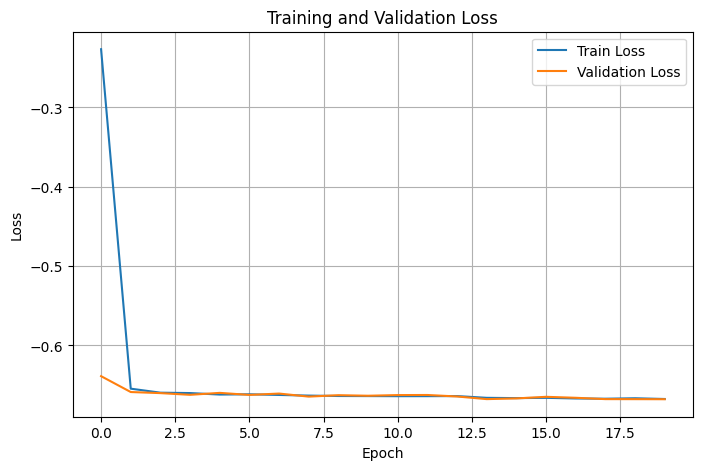

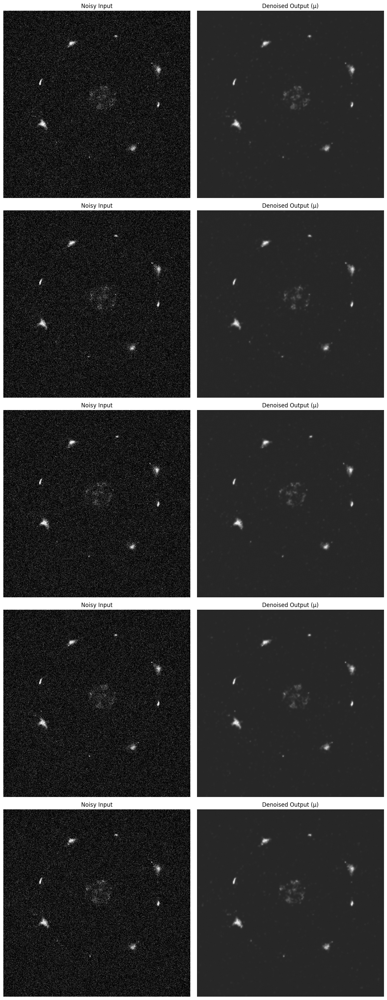

Model saved to /content/probabilistic_n2v_model.pth


**Interactive Denoising and Save: Probabilistic N2V:**
A second interactive system is built for testing the Probabilistic N2V model.
Users can upload a noisy .tif image, view the predicted denoised output alongside the noisy input, and optionally save the denoised result by clicking a save button.
This provides an intuitive and fully interactive way to test self-supervised denoising results without requiring programming knowledge, suitable for supervisor demonstration or deployment.
Inference runs fully on GPU if available.

Using device: cuda
✅ Model loaded and ready.
📂 Please upload a noisy .tif image:


FileUpload(value={}, accept='.tif', description='Upload')

Button(description='💾 Save Denoised Image', layout=Layout(visibility='hidden'), style=ButtonStyle())

✅ Uploaded file: noisy_jellyfish0000.tif


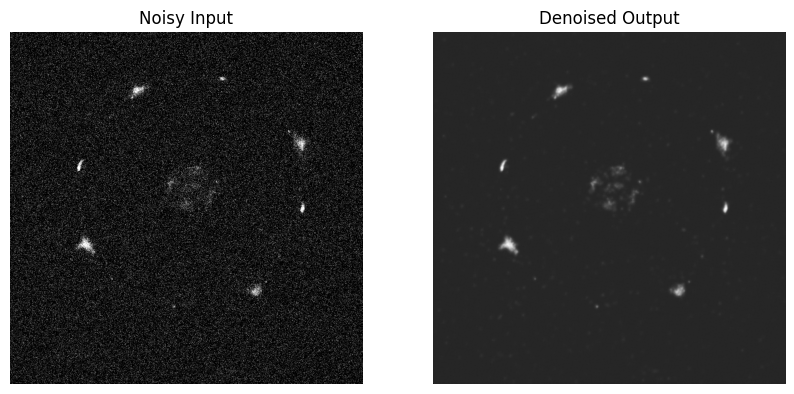

In [ ]:
import torch
import torch.nn as nn
import numpy as np
import matplotlib.pyplot as plt
import tifffile
import ipywidgets as widgets
from IPython.display import display
from io import BytesIO
import os

# === Device Setup ===
device = torch.device('cuda' if torch.cuda.is_available() else 'cpu')
print(f"Using device: {device}")

# === Define Probabilistic N2V Model ===
class ProbabilisticN2V(nn.Module):
    def __init__(self):
        super(ProbabilisticN2V, self).__init__()
        self.encoder = nn.Sequential(
            nn.Conv2d(1, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 64, 3, padding=1),
            nn.ReLU(inplace=True)
        )
        self.decoder = nn.Sequential(
            nn.Conv2d(64, 32, 3, padding=1),
            nn.ReLU(inplace=True),
            nn.Conv2d(32, 2, 3, padding=1)
        )

    def forward(self, x):
        x = self.encoder(x)
        out = self.decoder(x)
        mu, logvar = torch.chunk(out, 2, dim=1)
        return mu, logvar

# === Load Trained Probabilistic N2V ===
model = ProbabilisticN2V().to(device)
model.load_state_dict(torch.load('/content/probabilistic_n2v_model.pth'))
model.eval()
print("✅ Model loaded and ready.")

# === Save Path ===
save_folder = '/content/denoised_manual_save/'
os.makedirs(save_folder, exist_ok=True)

# === Upload Widget ===
uploader = widgets.FileUpload(
    accept='.tif',  # Accept only .tif files
    multiple=False  # Only single file
)

# === Save Button Placeholder ===
save_button = widgets.Button(description="💾 Save Denoised Image")
save_button.layout.visibility = 'hidden'

# === Define Global to Store Denoised Image ===
global_denoised_image = None
global_filename = None

def on_upload_change(change):
    global global_denoised_image, global_filename

    for filename, fileinfo in uploader.value.items():
        print(f"✅ Uploaded file: {filename}")

        # Read uploaded file
        file_bytes = BytesIO(fileinfo['content'])
        img = tifffile.imread(file_bytes).astype(np.float32)
        img = (img - img.min()) / (img.max() - img.min())  # Normalize to [0,1]

        img_tensor = torch.from_numpy(img).unsqueeze(0).unsqueeze(0).to(device)

        # Denoise
        with torch.no_grad():
            mu, logvar = model(img_tensor)
            denoised = mu.squeeze().cpu().numpy()

        global_denoised_image = denoised
        global_filename = filename

        # Plot
        plt.figure(figsize=(10,5))

        plt.subplot(1,2,1)
        plt.imshow(img, cmap='gray')
        plt.title('Noisy Input')
        plt.axis('off')

        plt.subplot(1,2,2)
        plt.imshow(denoised, cmap='gray')
        plt.title('Denoised Output')
        plt.axis('off')

        plt.show()

        # Show Save Button
        save_button.layout.visibility = 'visible'

def on_save_button_clicked(b):
    global global_denoised_image, global_filename
    if global_denoised_image is not None and global_filename is not None:
        save_path = os.path.join(save_folder, f"denoised_{global_filename}")
        tifffile.imwrite(save_path, (np.clip(global_denoised_image, 0, 1) * 65535).astype(np.uint16))
        print(f"✅ Saved denoised image to {save_path}")
    else:
        print("⚠️ No denoised image available to save.")

# === Connect uploader to handler ===
uploader.observe(on_upload_change, names='value')

# === Connect save button to handler ===
save_button.on_click(on_save_button_clicked)

# === Display ===
print("📂 Please upload a noisy .tif image:")
display(uploader)
display(save_button)


In [1]:
DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
print("All neural models will use:", DEVICE)


NameError: name 'torch' is not defined

In [3]:
!pip install torch